<a href="https://colab.research.google.com/github/Shashwat26Bhatnagar/Instagram_analysis/blob/main/Image_captioning_with_lstm_seq2seq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d adityajn105/flickr8k

 99% 1.03G/1.04G [00:05<00:00, 201MB/s]
100% 1.04G/1.04G [00:05<00:00, 195MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/flickr8k.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
data_location =  "/kaggle/input/flickr8k"
!ls $data_location

In [ ]:
#reading the text data
import pandas as pd
caption_file = 'captions.txt'
df = pd.read_csv(caption_file)
print("There are {} image to captions".format(len(df)))
df.head(7)

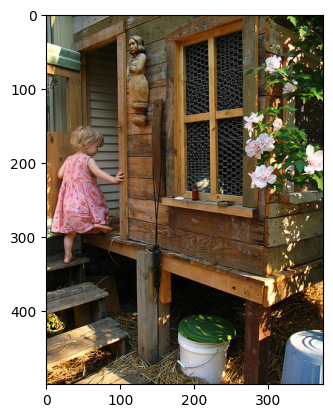

Caption: A child in a pink dress is climbing up a set of stairs in an entry way .
Caption: A girl going into a wooden building .
Caption: A little girl climbing into a wooden playhouse .
Caption: A little girl climbing the stairs to her playhouse .
Caption: A little girl in a pink dress going into a wooden cabin .


In [19]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#select any index from the whole dataset
#single image has 5 captions
#so, select indx as: 0,5,10.....
data_idx = 0


#eg path to be plot: ../input/flickr8k/Images/1000268201_693b08cb0e.jpg
image_path = data_location+"/"+df.iloc[data_idx,0]
img=mpimg.imread(image_path)
plt.imshow(img)
plt.show()

#image consits of 5 captions,
#showing all 5 captions of the image of the given idx
for i in range(data_idx,data_idx+5):
    print("Caption:",df.iloc[i,1])

In [22]:
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

from PIL import Image

In [ ]:
#using spacy for the better text tokenization
spacy_eng = spacy.load("en_core_web_sm")

#example
text = "Duabi is a great place"
[token.text.lower() for token in spacy_eng.tokenizer(text)]

In [26]:
class Vocabulary:
    def __init__(self,freq_threshold):
        #setting the pre-reserved tokens int to string tokens
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}

        #string to int tokens
        #its reverse dict self.itos
        self.stoi = {v:k for k,v in self.itos.items()}

        self.freq_threshold = freq_threshold

    def __len__(self): return len(self.itos)

    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]

    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1

                #add the word to the vocab if it reaches minum frequecy threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1
    def numericalize(self,text):
        """ For each word in the text corresponding index token for that word form the vocab built as list """
        tokenized_text = self.tokenize(text)
        return [ self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text ]

In [27]:
#testing the vicab class
v = Vocabulary(freq_threshold=1)

v.build_vocab(["i know my name"])
print(v.stoi)
print(v.numericalize("i know my name>"))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'i': 4, 'know': 5, 'my': 6, 'name': 7}
[4, 5, 6, 7, 3]


In [28]:
class FlickrDataset(Dataset):
    """
    FlickrDataset
    """
    def __init__(self,root_dir,caption_file,transform=None,freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(caption_file)
        self.transform = transform

        #Get image and caption colum from the dataframe
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        #Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())


    def __len__(self):
        return len(self.df)
    def __getitem__(self,idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir,img_name)
        img = Image.open(img_location).convert("RGB")

        #apply the transfromation to the image
        if self.transform is not None:
            img = self.transform(img)

        #numericalize the caption text
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

In [29]:
#defing the transform to be applied
transforms = T.Compose([
    T.Resize((224,224)),
    T.ToTensor()
])

In [30]:
def show_image(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

In [35]:
#testing the dataset class
dataset =  FlickrDataset(
    root_dir = data_location+"/",
    caption_file = "/content/captions.txt",
    transform=transforms
)

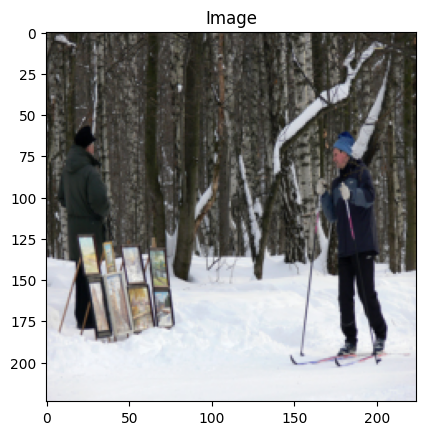

Token: tensor([   1,    4,   14,  594,  466,   84,   14, 2819, 2576,    8,   10,   31,
           5,    2])
Sentence:
['<SOS>', 'a', 'man', 'skis', 'past', 'another', 'man', 'displaying', 'paintings', 'in', 'the', 'snow', '.', '<EOS>']


In [36]:
img, caps = dataset[56]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

In [37]:
class CapsCollate:
    """
    Collate to apply the padding to the captions with dataloader
    """
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self,batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)

        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

In [38]:
#writing the dataloader
#setting the constants
BATCH_SIZE = 4
NUM_WORKER = 1

#token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


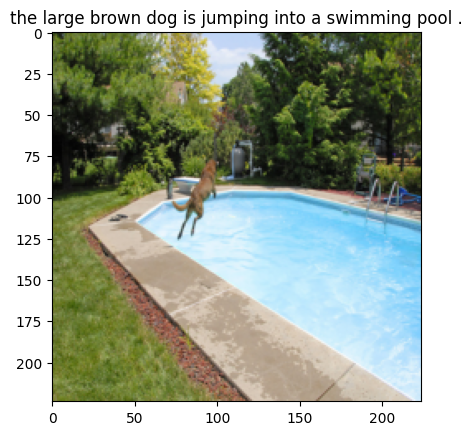

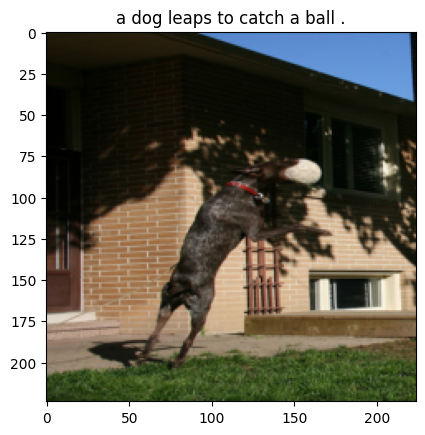

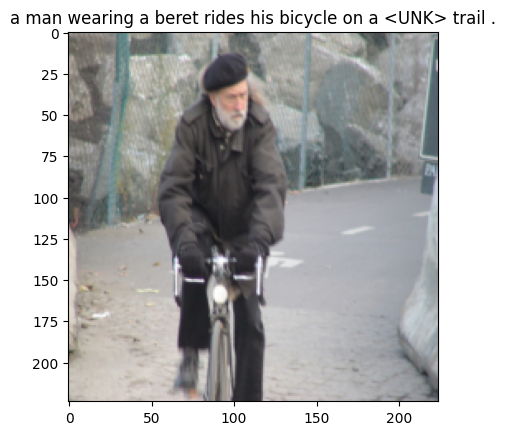

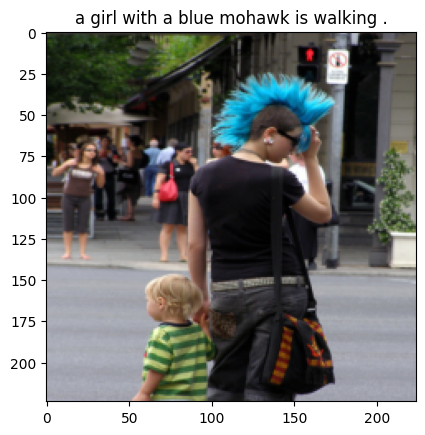

In [39]:
#generating the iterator from the dataloader
dataiter = iter(data_loader)

#getting the next batch
batch = next(dataiter)

#unpacking the batch
images, captions = batch

#showing info of image in single batch
for i in range(BATCH_SIZE):
    img,cap = images[i],captions[i]
    caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)
    show_image(img,caption_label)
    plt.show()

In [40]:
import numpy as np
import torch
import torchvision.transforms as T


In [41]:
def show_image(img, title=None):
    """Imshow for Tensor."""

    #unnormalize
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))


    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

Model is seq2seq model. In the encoder pretrained ResNet model is used to extract the features. Decoder, is the implementation of the Bahdanau Attention Decoder. In the decoder model LSTM cell.**bold text**

In [42]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

In [43]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)

        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)


    def forward(self, images):
        features = self.resnet(images)                                    #(batch_size,2048,7,7)
        features = features.permute(0, 2, 3, 1)                           #(batch_size,7,7,2048)
        features = features.view(features.size(0), -1, features.size(-1)) #(batch_size,49,2048)
        return features

In [44]:
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()

        self.attention_dim = attention_dim

        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)

        self.A = nn.Linear(attention_dim,1)




    def forward(self, features, hidden_state):
        u_hs = self.U(features)     #(batch_size,num_layers,attention_dim)
        w_ah = self.W(hidden_state) #(batch_size,attention_dim)

        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) #(batch_size,num_layers,attemtion_dim)

        attention_scores = self.A(combined_states)         #(batch_size,num_layers,1)
        attention_scores = attention_scores.squeeze(2)     #(batch_size,num_layers)


        alpha = F.softmax(attention_scores,dim=1)          #(batch_size,num_layers)

        attention_weights = features * alpha.unsqueeze(2)  #(batch_size,num_layers,features_dim)
        attention_weights = attention_weights.sum(dim=1)   #(batch_size,num_layers)

        return alpha,attention_weights


In [45]:
class DecoderRNN(nn.Module):

    def __init__(
        self,
        embed_size,
        vocab_size,
        attention_dim,
        encoder_dim,
        decoder_dim,
        drop_prob=0.3,
        ):
        super().__init__()

        # save the model param

        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim

        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.attention = Attention(encoder_dim, decoder_dim,
                                   attention_dim)

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.lstm_cell = nn.LSTMCell(embed_size + encoder_dim,
                decoder_dim, bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)

        self.fcn = nn.Linear(decoder_dim, vocab_size)
        self.drop = nn.Dropout(drop_prob)

    def forward(self, features, captions):

        # vectorize the caption

        embeds = self.embedding(captions)

        # Initialize LSTM state

        (h, c) = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        # get the seq length to iterate

        seq_length = len(captions[0]) - 1  # Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)

        preds = torch.zeros(batch_size, seq_length,
                            self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,
                             num_features).to(device)

        for s in range(seq_length):
            (alpha, context) = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            (h, c) = self.lstm_cell(lstm_input, (h, c))

            output = self.fcn(self.drop(h))

            preds[:, s] = output
            alphas[:, s] = alpha

        return (preds, alphas)

    def generate_caption(
        self,
        features,
        max_len=20,
        vocab=None,
        ):

        # Inference part
        # Given the image features generate the captions

        batch_size = features.size(0)
        (h, c) = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        alphas = []

        # starting input

        word = torch.tensor(vocab.stoi['<SOS>']).view(1, -1).to(device)
        embeds = self.embedding(word)

        captions = []

        for i in range(max_len):
            (alpha, context) = self.attention(features, h)

            # store the apla score

            alphas.append(alpha.cpu().detach().numpy())

            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            (h, c) = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size, -1)

            # select the word with most val

            predicted_word_idx = output.argmax(dim=1)

            # save the generated word

            captions.append(predicted_word_idx.item())

            # end if <EOS detected>

            if vocab.itos[predicted_word_idx.item()] == '<EOS>':
                break

            # send generated word as the next caption

            embeds = self.embedding(predicted_word_idx.unsqueeze(0))

        # covert the vocab idx to words and return sentence

        return ([vocab.itos[idx] for idx in captions], alphas)

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return (h, c)


In [46]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
#             vocab_size = len(dataset.vocab),
            vocab_size=vocab_size,
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

In [48]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
embed_size=300
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4
#init model
model = EncoderDecoder(
    embed_size=300,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

In [49]:
def save_model(model,num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }
    torch.save(model_state, '/kaggle/working/attention_model_state.pth')

Mounted at /content/drive
Epoch: 1 loss: 3.05266


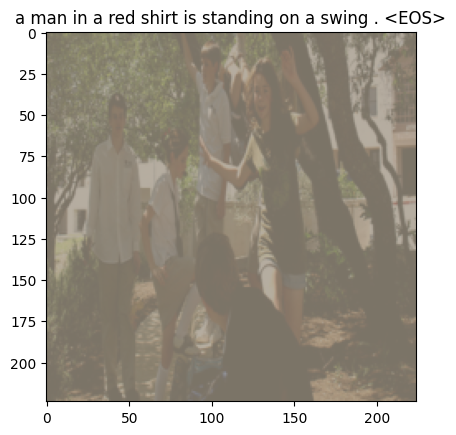

Epoch: 1 loss: 3.84991


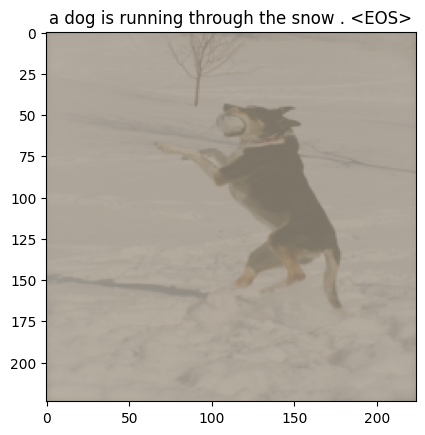

Epoch: 1 loss: 3.05111


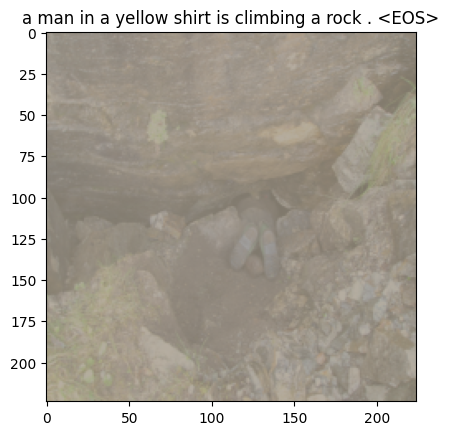

Epoch: 1 loss: 3.53575


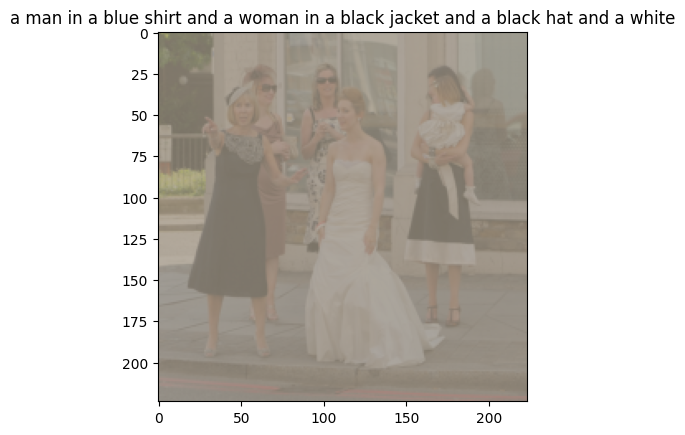

Epoch: 1 loss: 2.18287


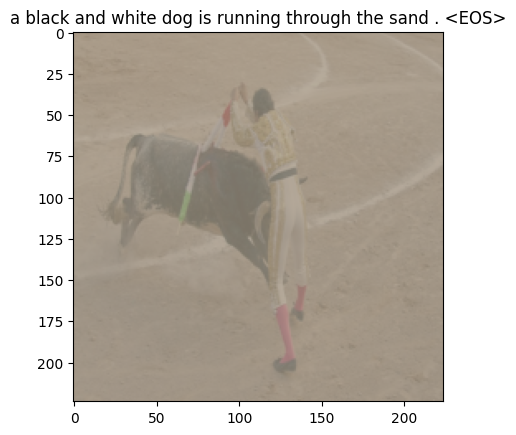

Epoch: 1 loss: 2.73850


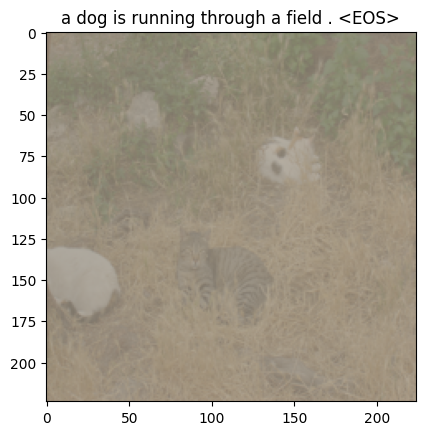

Epoch: 1 loss: 3.72285


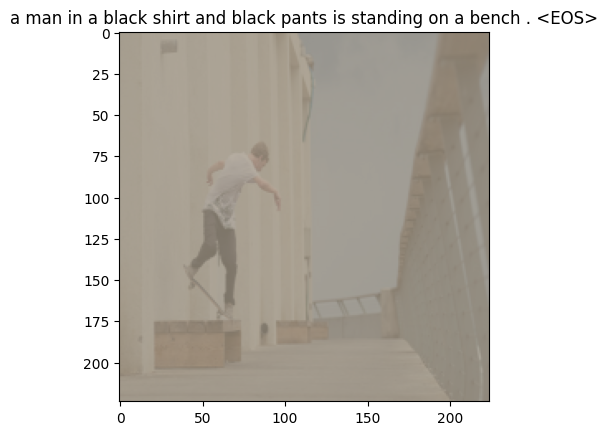

Epoch: 1 loss: 3.08270


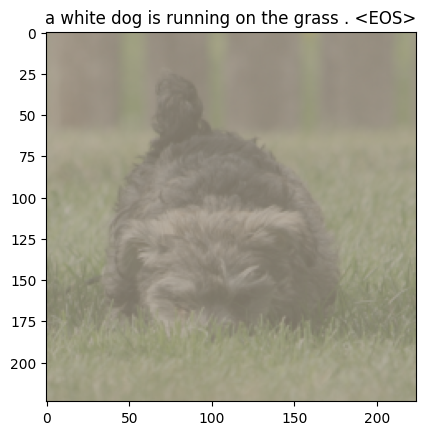

Epoch: 1 loss: 2.98686


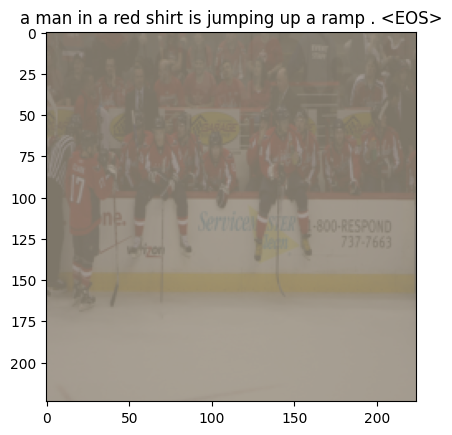

Epoch: 1 loss: 3.30926


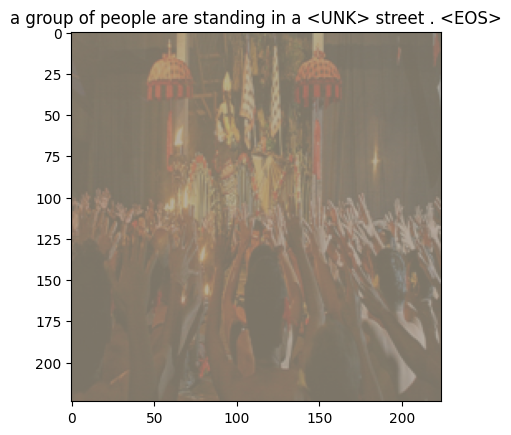

Epoch: 1 loss: 3.06983


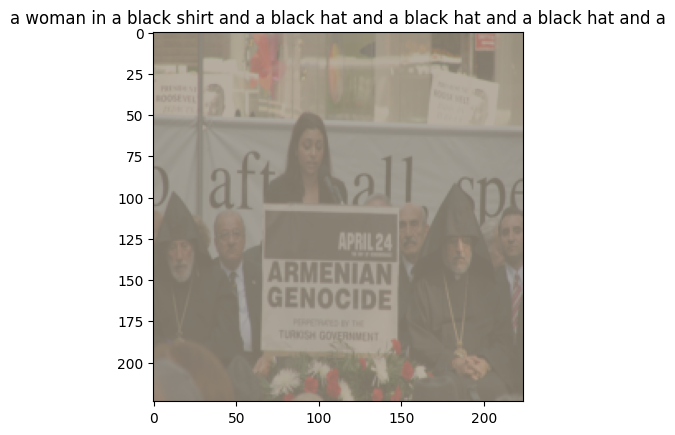

Epoch: 1 loss: 3.17925


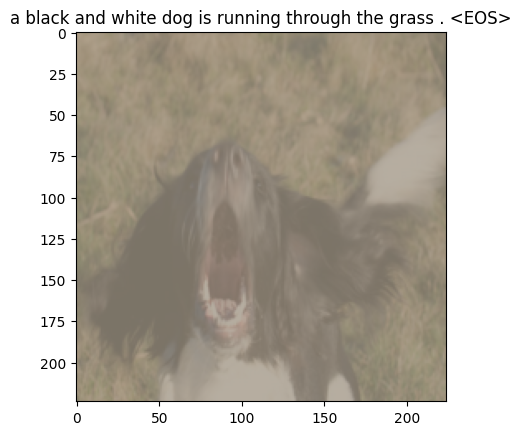

Epoch: 1 loss: 3.06584


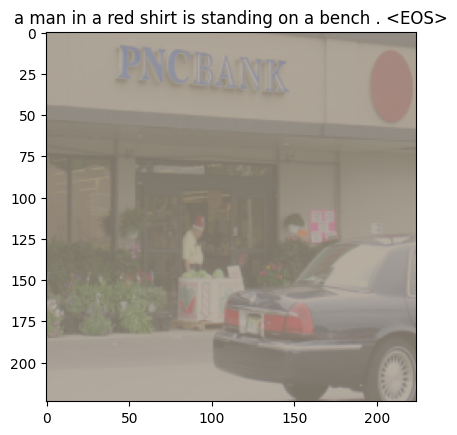

Epoch: 1 loss: 2.90445


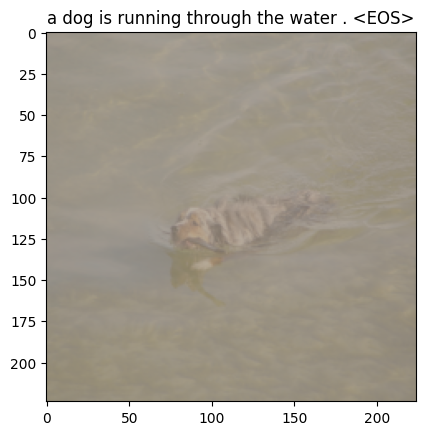

Epoch: 1 loss: 2.93675


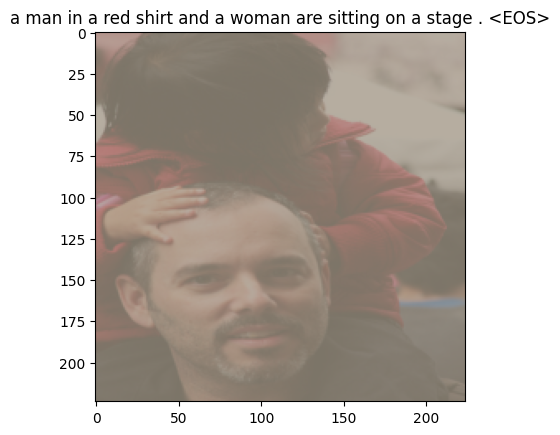

Epoch: 1 loss: 3.13905


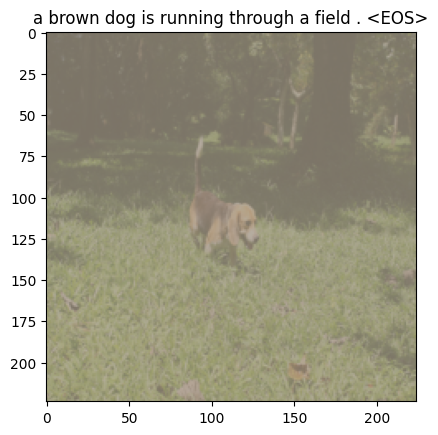

Epoch: 1 loss: 3.27648


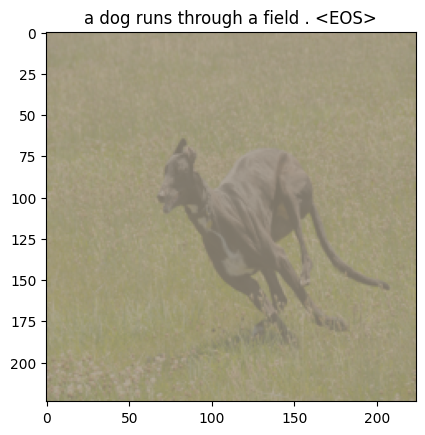

Epoch: 1 loss: 2.88166


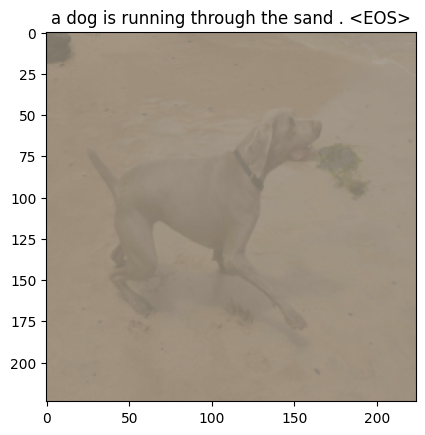

Epoch: 1 loss: 2.53659


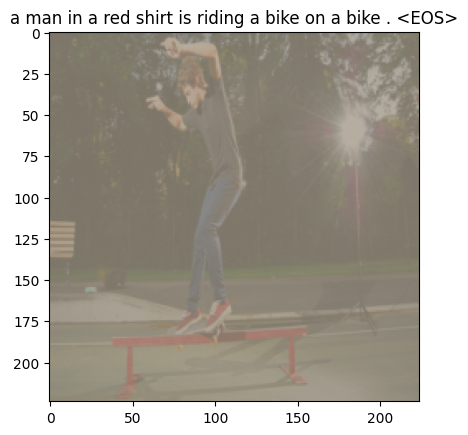

Epoch: 1 loss: 2.86839


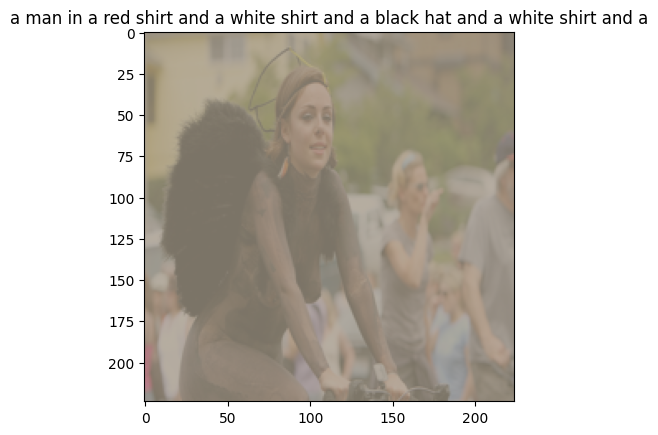

Epoch: 1 loss: 3.64106


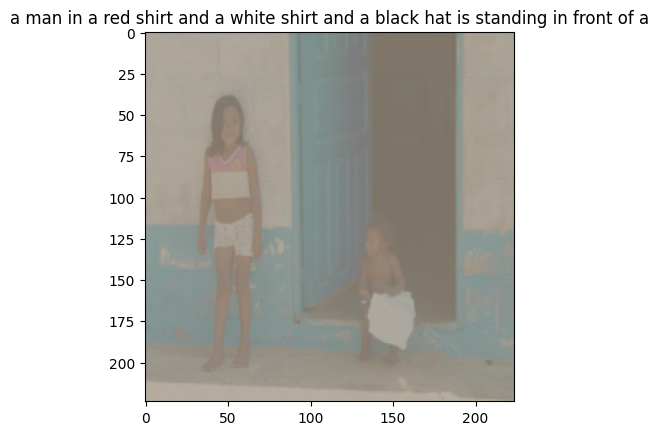

Epoch: 1 loss: 3.73039


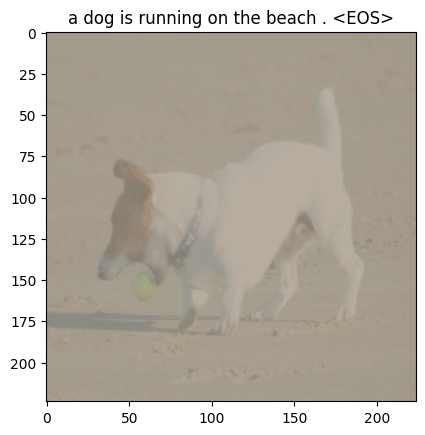

Epoch: 1 loss: 2.96518


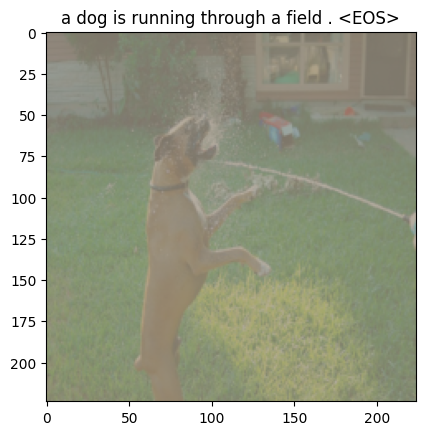

Epoch: 1 loss: 2.44460


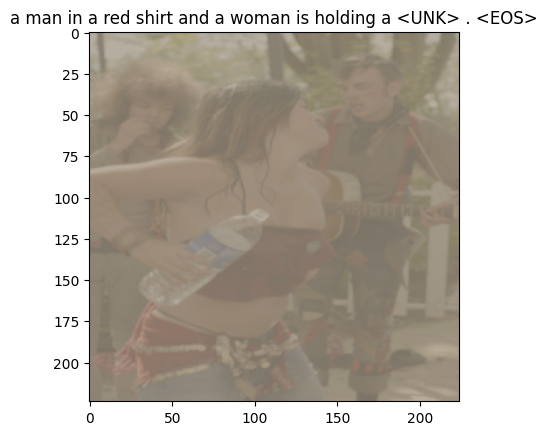

Epoch: 1 loss: 2.48723


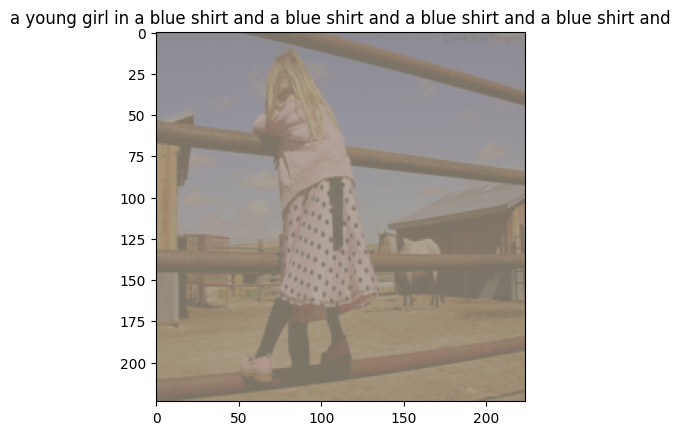

Epoch: 1 loss: 3.05205


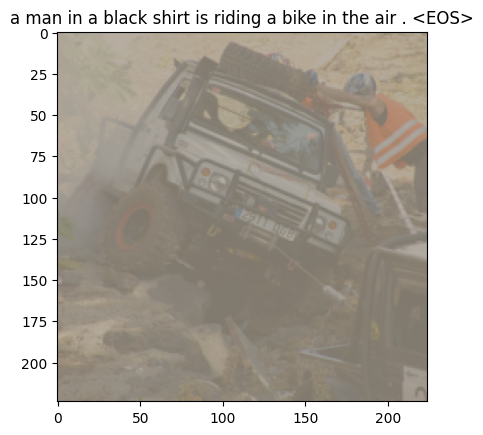

Epoch: 1 loss: 2.17398


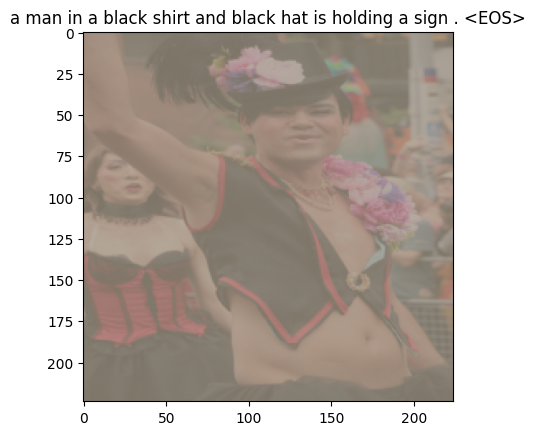

Epoch: 1 loss: 2.29459


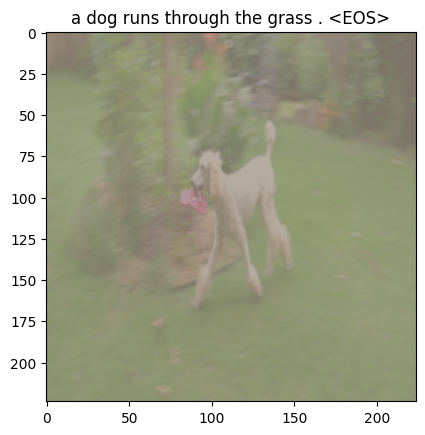

Epoch: 1 loss: 3.46741


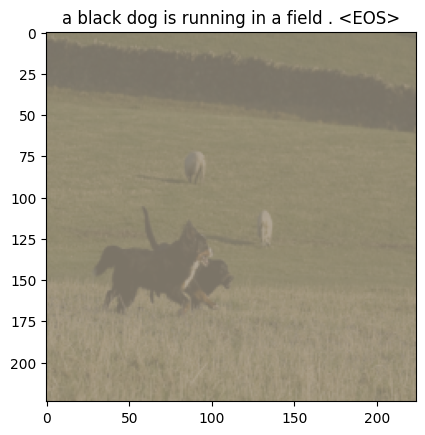

Epoch: 1 loss: 2.15931


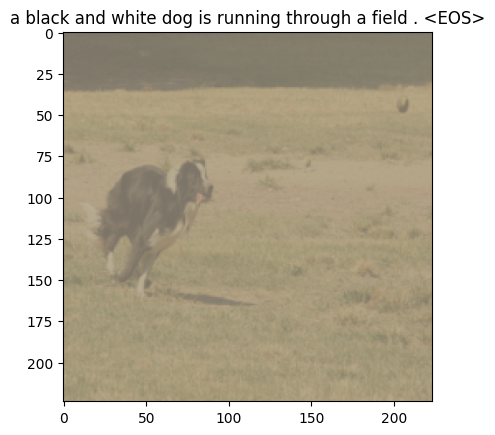

Epoch: 1 loss: 2.94850


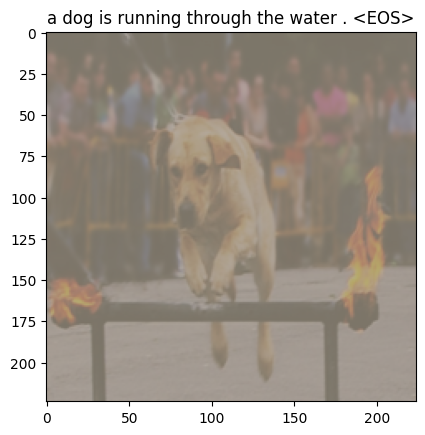

Epoch: 1 loss: 3.22114


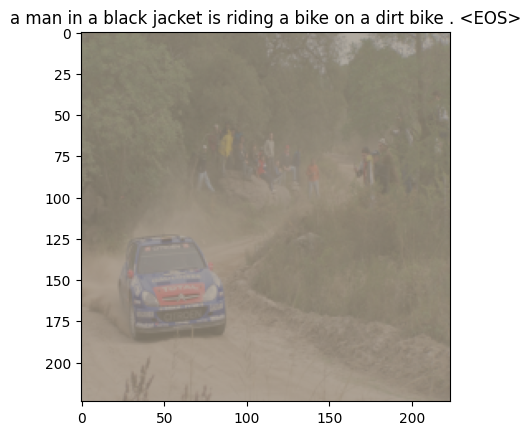

Epoch: 1 loss: 2.56837


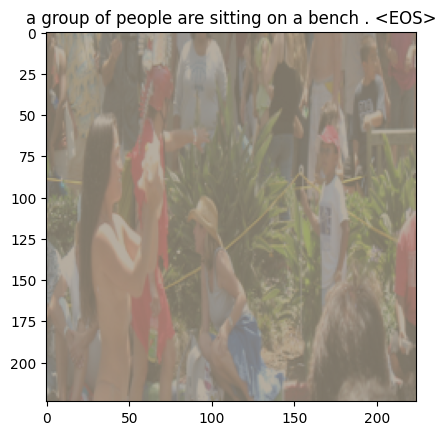

Epoch: 1 loss: 1.88351


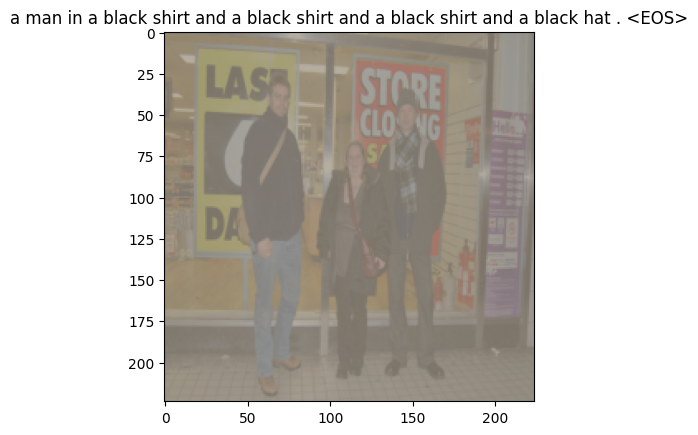

Epoch: 1 loss: 3.56912


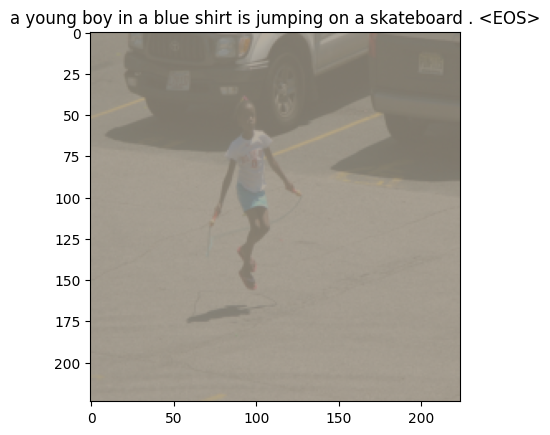

Epoch: 1 loss: 2.87610


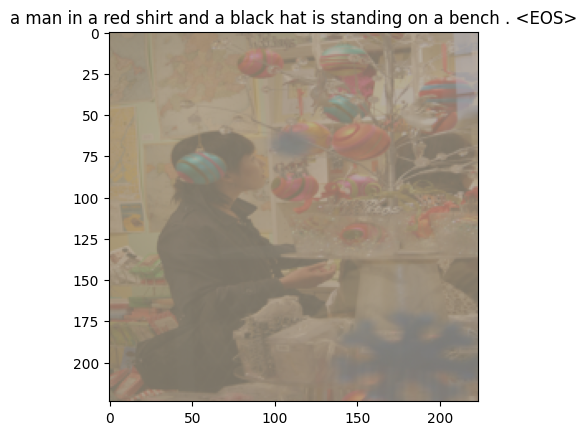

Epoch: 1 loss: 2.84064


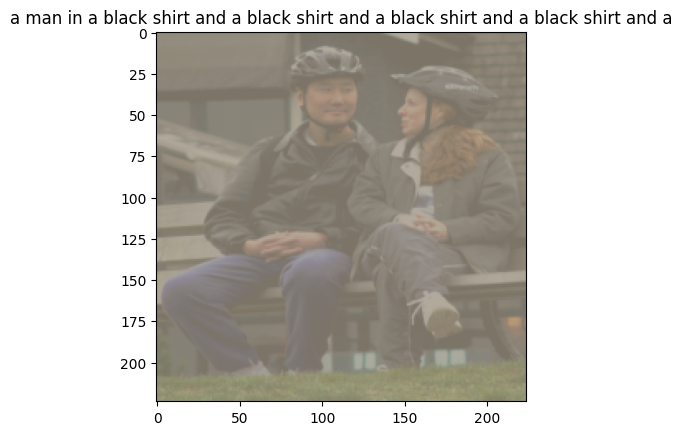

Epoch: 1 loss: 3.27325


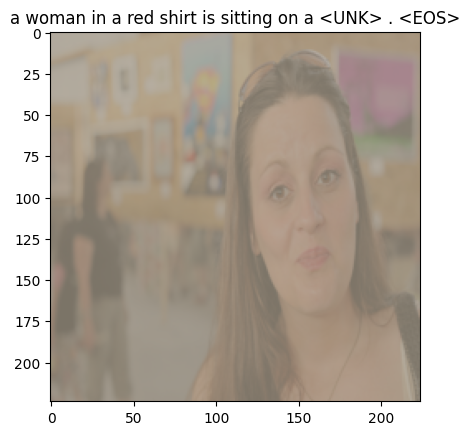

Epoch: 1 loss: 2.29747


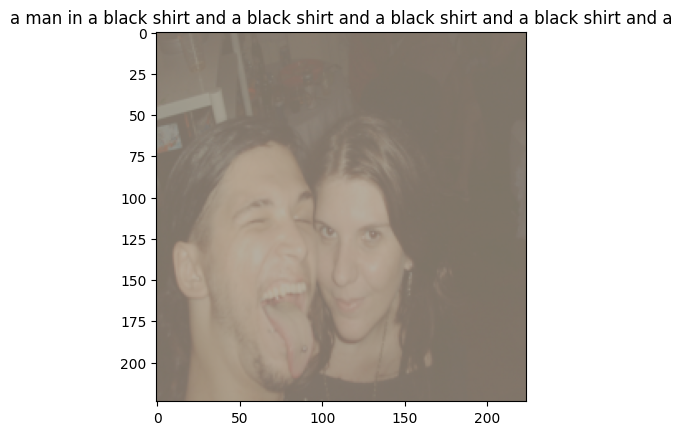

Epoch: 1 loss: 2.33766


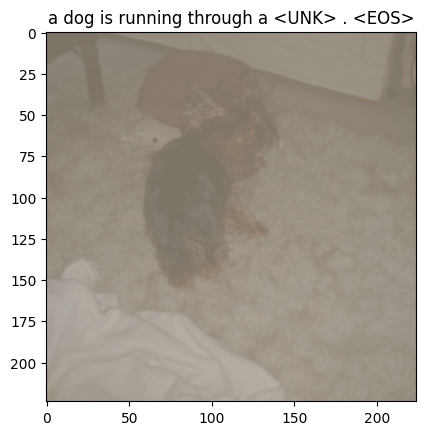

Epoch: 1 loss: 3.88586


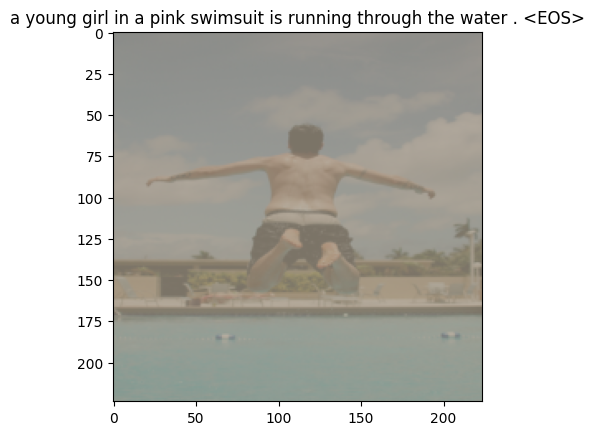

Epoch: 1 loss: 2.81189


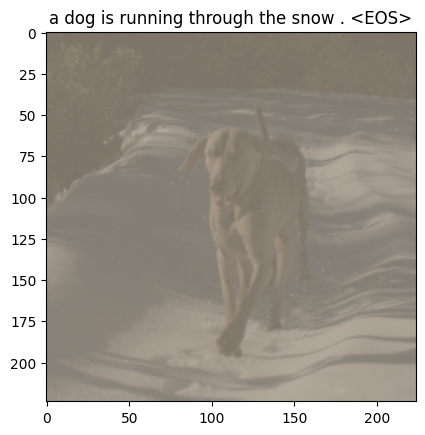

Epoch: 1 loss: 2.64956


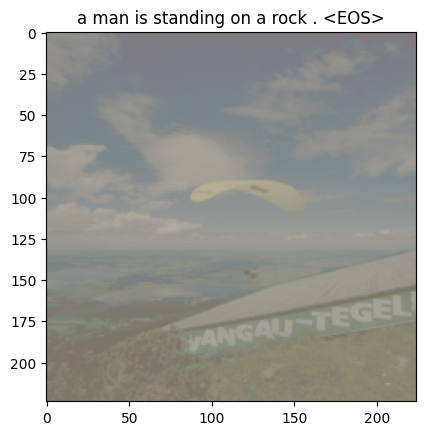

Epoch: 1 loss: 3.03755


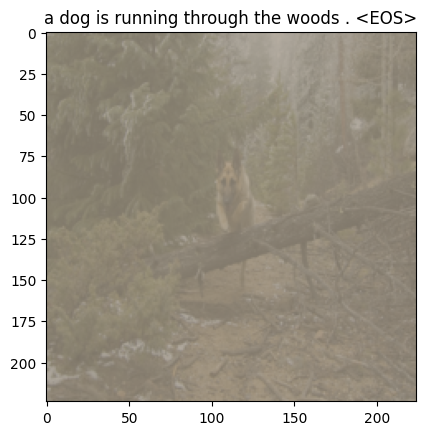

Epoch: 1 loss: 2.49884


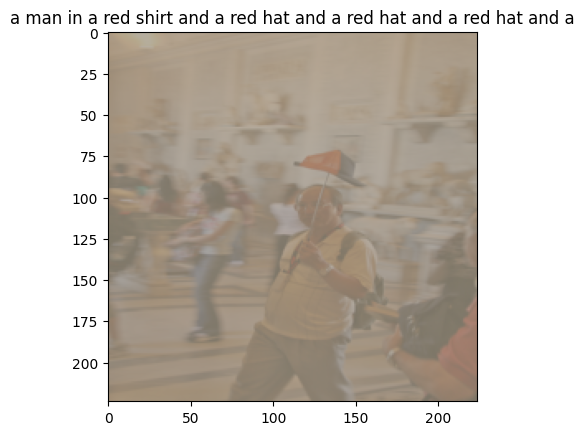

Epoch: 1 loss: 2.58567


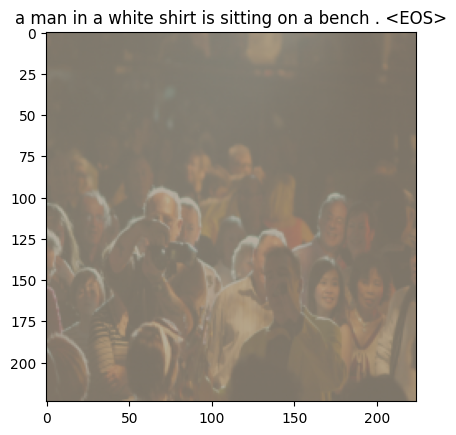

Epoch: 1 loss: 2.54729


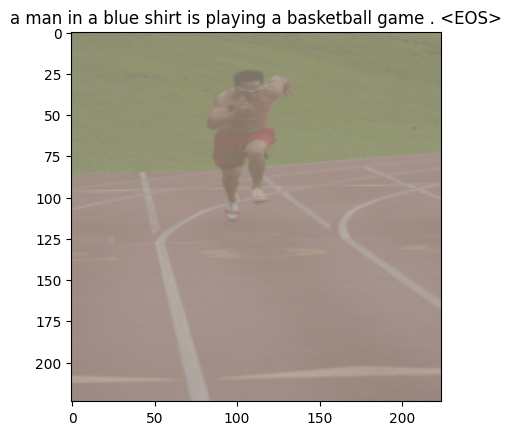

Epoch: 1 loss: 3.25765


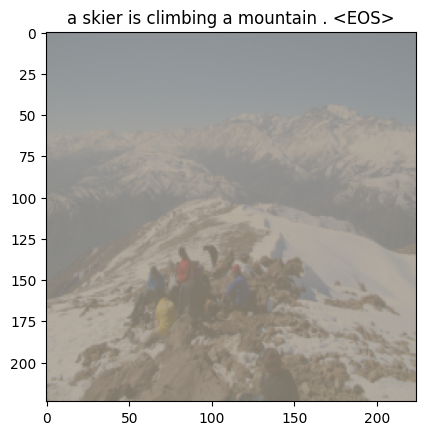

Epoch: 1 loss: 2.82924


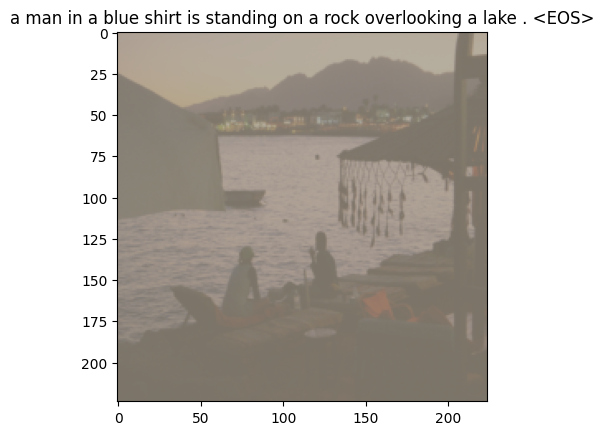

Epoch: 1 loss: 2.57557


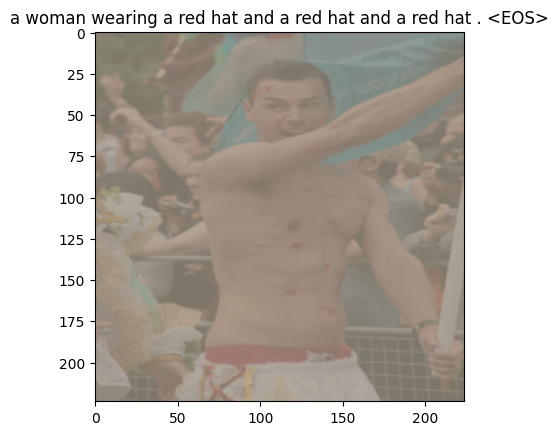

Epoch: 1 loss: 2.87670


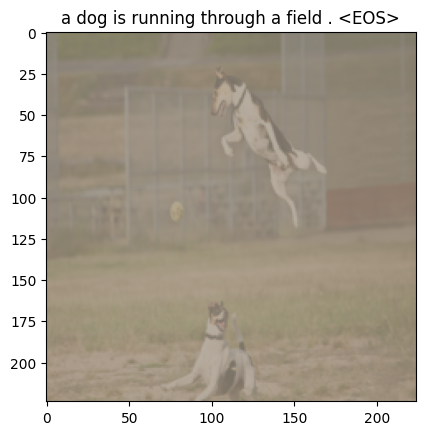

In [ ]:
from google.colab import drive
import os

# Mount Google Drive to save the model
drive.mount('/content/drive')

num_epochs = 15
print_every = 100

try:
    for epoch in range(1, num_epochs + 1):
        for idx, (image, captions) in enumerate(iter(data_loader)):
            image, captions = image.to(device), captions.to(device)

            # Zero the gradients.
            optimizer.zero_grad()

            # Feed forward
            outputs, attentions = model(image, captions)

            # Calculate the batch loss.
            targets = captions[:, 1:]
            loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

            # Backward pass.
            loss.backward()

            # Update the parameters in the optimizer.
            optimizer.step()

            if (idx + 1) % print_every == 0:
                print("Epoch: {} loss: {:.5f}".format(epoch, loss.item()))

                # Generate a caption
                model.eval()
                with torch.no_grad():
                    dataiter = iter(data_loader)
                    img, _ = next(dataiter)
                    features = model.encoder(img[0:1].to(device))
                    caps, alphas = model.decoder.generate_caption(features, vocab=dataset.vocab)
                    caption = ' '.join(caps)
                    show_image(img[0], title=caption)

                model.train()

        # Save the latest model after each epoch
        save_model(model, epoch)

except KeyboardInterrupt:
    # Save the model if interrupted
    print("Training interrupted. Saving the current model state...")
    model_save_path = '/content/drive/MyDrive/trained_model.pth'
    torch.save(model.state_dict(), model_save_path)
    print("Model saved to:", model_save_path)


In [2]:
import torch

In [ ]:
# Load the saved model
saved_model_path = "attention_model_state.pth"
# saved_model_state = torch.load(saved_model_path)
checkpoint = torch.load(saved_model_path)
model.load_state_dict(checkpoint['state_dict'])

In [ ]:
model.eval()
with torch.no_grad():
    # dls or validation_loader
    itr = iter(data_loader)
    img, captions= next(itr)

    caption = captions[0:1][0].tolist()
    s = [dataset.vocab.itos[idx] for idx in caption if idx != 0] # if idx != 0 and idx != 1 and idx != 2
    print("Original:", ' '.join(s))

    # extract features
    print(img[0:1].shape)
    features = model.encoder(img[0:1].to(device))

    # get predictions
    pred_caps, alphas = model.decoder.generate_caption(features, vocab=dataset.vocab)

    # make it printable
    caption = ' '.join(pred_caps)
    print("Predicted:", caption)
    show_image(img[0])

In [ ]:
from torchvision import transforms
import matplotlib.pyplot as plt
model.eval()
with torch.no_grad():
    # Load a single image


    # Load and preprocess a single image
    image_path = "/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg"  # Replace with the actual path to your image
    image = Image.open(image_path).convert("RGB")

    preprocess = transforms.Compose([
        transforms.Resize(226),
        transforms.RandomCrop(224),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

    processed_image = preprocess(image)

    # Add a batch dimension to the processed image
    processed_image = processed_image.unsqueeze(0)


    features = model.encoder(processed_image.to(device))
    pred_caps, alphas = model.decoder.generate_caption(features, vocab=dataset.vocab)
    predicted_caption = ' '.join(pred_caps)
# Convert the processed image tensor to a numpy array
image = processed_image.squeeze(0).permute(1, 2, 0).cpu().numpy()

# Display the image
plt.imshow(image)
plt.axis('off')
plt.show()
print("Predicted Caption:", predicted_caption)

In [ ]:
from nltk.translate.bleu_score import corpus_bleu

# Assuming 'references' is a list of reference captions for the image
# and 'predicted_caption' is the predicted caption generated by your model
references = [['A child in a pink dress is climbing up a set of stairs in an entry way .', 'A girl going into a wooden building .', 'A little girl climbing into a wooden playhouse .','A little girl climbing the stairs to her playhouse .','A little girl in a pink dress going into a wooden cabin .']]
predicted_caption = ' '.join(pred_caps)

# Convert the predicted caption into a list of tokens
predicted_tokens = predicted_caption.split()

# Convert the reference captions into a list of lists of tokens
reference_tokens = [ref.split() for ref in references[0]]

# Calculate the BLEU score
bleu_score = corpus_bleu([reference_tokens], [predicted_tokens])

# Print the BLEU score
print("BLEU Score:", bleu_score)

In [ ]:
#generate caption
def get_caps_from(features_tensors):
    #generate the caption
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0],title=caption)

    return caps,alphas

#Show attention
def plot_attention(img, result, attention_plot):
    #untransform
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)

        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())


    plt.tight_layout()
    plt.show()
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)
img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)